In [1]:
import numpy as np
import soundfile as sf
from IPython.display import display
from IPython.display import Audio
import matplotlib.pyplot as plt
import scipy

In [2]:
MIDIFROM = 24
MIDITO = 108
SKIP_SEC = 0.25
HOWMUCH_SEC = 0.5
WHOLETONE_SEC = 2

In [3]:
# My signals
NOTES = [36, 47, 87]
NOTE_FREQS = [65.41, 123.47, 1244.52]

In [4]:
howmanytones = MIDITO - MIDIFROM + 1
tones = np.arange(MIDIFROM, MIDITO+1)
s, Fs = sf.read('../audio/klavir.wav')
N = int(Fs * HOWMUCH_SEC)
Nwholetone = int(Fs * WHOLETONE_SEC)
xall = np.zeros((MIDITO+1, N))
 # matrix with all tones - first signals empty,
# but we have plenty of memory ...

In [5]:
samplefrom = int(SKIP_SEC * Fs)
sampleto = samplefrom + N
for tone in tones:
    x = s[samplefrom:sampleto]
    x = x - np.mean(x)
    # safer to center ...
    xall[tone,:] = x
    samplefrom += Nwholetone
    sampleto += Nwholetone

#  4.1 Základy

Audio of note 0 (MIDI 36):


Audio of note 1 (MIDI 47):


Audio of note 2 (MIDI 87):


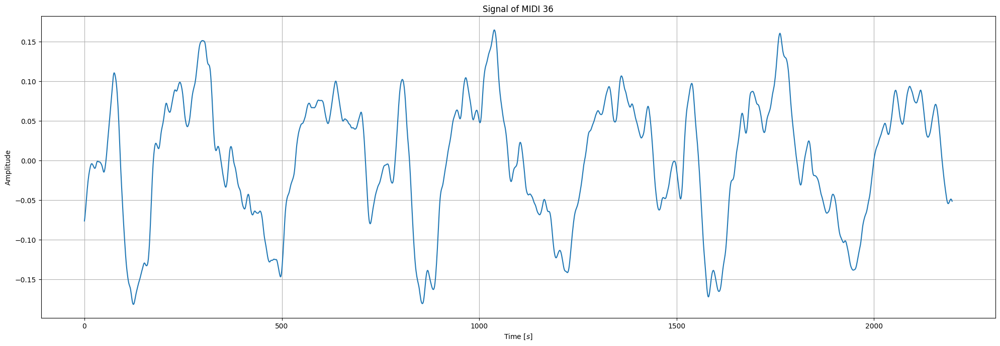

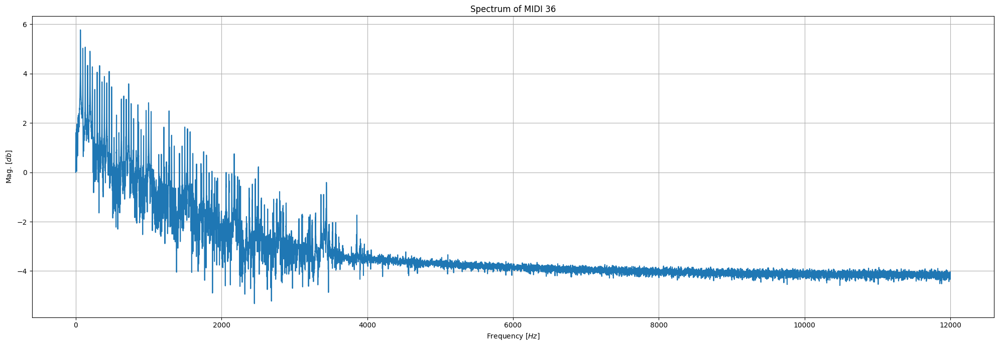

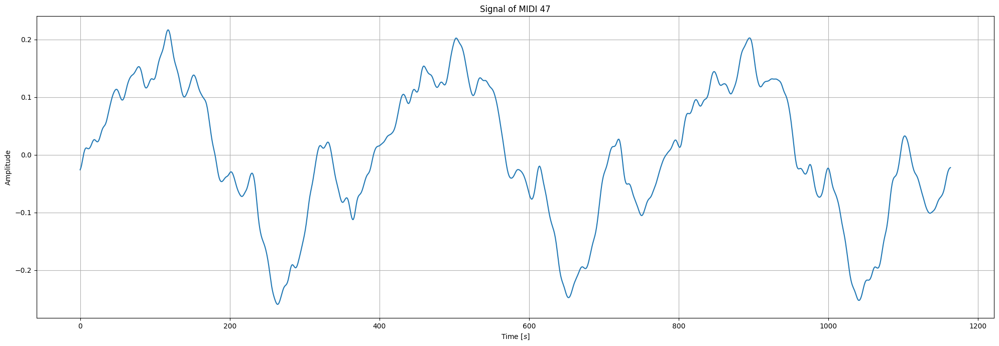

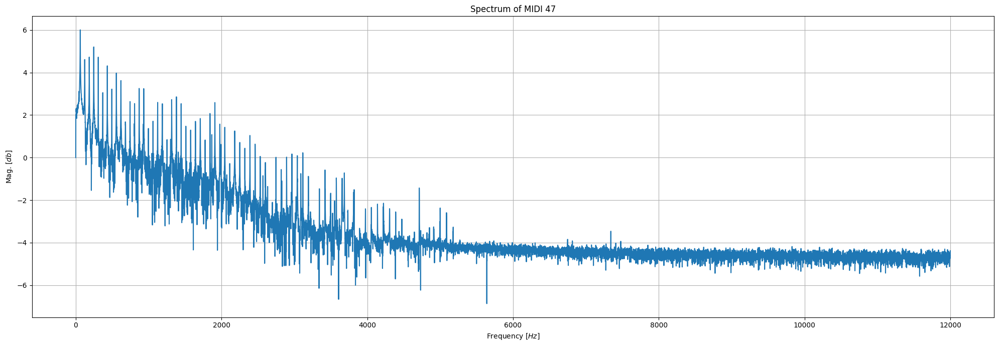

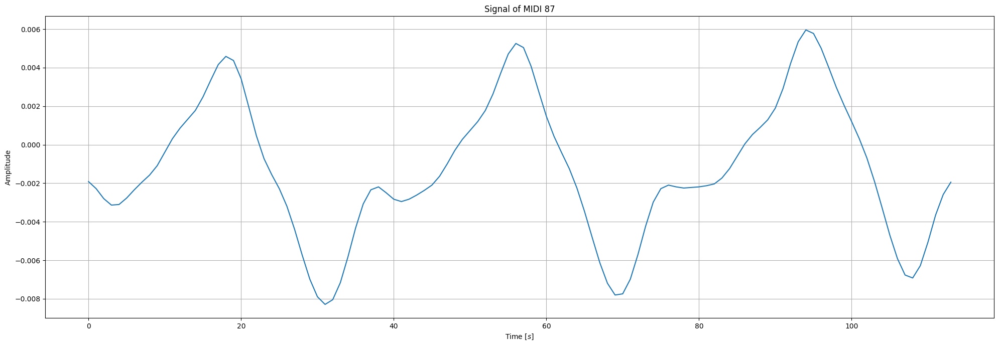

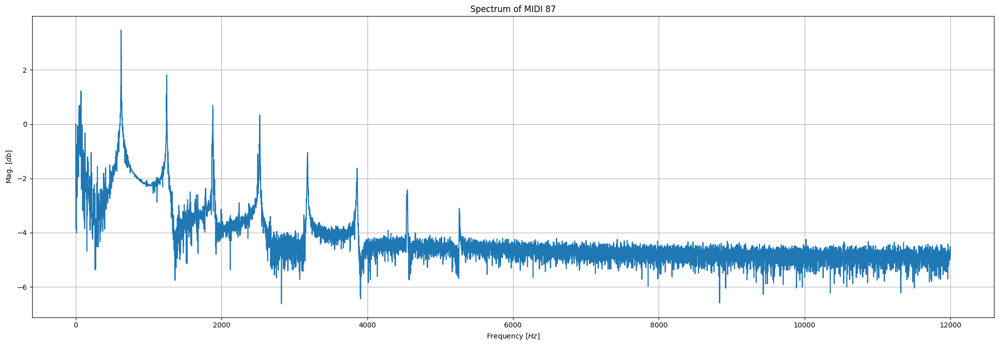

In [6]:
PERIOD_REPEAT = 3

# Coputing dft for all notes 
spectrum = np.zeros([MIDITO+1, Fs//2], dtype=complex)
for note in range(MIDIFROM, MIDITO+1):
    spectrum[note] = np.fft.fft(xall[note])

# Iterate through my MIDI
for i, note in enumerate(NOTES):
    print(f"Audio of note {i} (MIDI {note}):")
    display(Audio(xall[note][int(Fs * SKIP_SEC) : int(Fs * (SKIP_SEC+HOWMUCH_SEC))], rate=Fs))
    left_bound = 0
    right_bound = left_bound + int(Fs / NOTE_FREQS[i]) * PERIOD_REPEAT

    sample = xall[note][left_bound:right_bound]
    
    # Signal
    fig = plt.figure(figsize=(20, 7))
    ax = fig.add_subplot(111)
    ax.set_title(f"Signal of MIDI {note}")
    ax.set_xlabel(f"Time $[s]$")
    ax.set_ylabel(f"Amplitude")
    ax.plot(sample)
    ax.grid()
    plt.tight_layout()
    
    # Spectrum
    fig = plt.figure(figsize=(20, 7))
    ax = fig.add_subplot(111)
    s = np.log10(np.abs(spectrum[note]) ** 2)
    s[0] = 0.00001
    ax.set_title(f"Spectrum of MIDI {note}")
    ax.set_xlabel(f"Frequency $[Hz]$")
    ax.set_ylabel(f"Mag. $[db]$")
    ax.plot(np.real(s[:s.size//2]))
    ax.grid()
    plt.tight_layout()

# 4.2 Určení základní frekvence 

Do MIDI 60 používám metodu autokorelace, z jejiž délky mezi vrcholi získám proměnnou *p*, kterou pak převádím na frekvenci následovně:
$$
\verb|freq| = \frac{1}{p} \cdot F_s
$$

Na zbytek hodnot používám DFT. Zde stačí najít maxima absolutní hodnoty a dosadit jako *m* do následujícího vzorce:
$$
\verb|freq| = m \cdot \frac{F_s}{N}
$$

In [7]:
# Returns index of the highest element in the array.
def max_index(array):
    i = 0
    val = array[0]
    for index, a_val in enumerate(array):
        if a_val >= val:
            i = index
            val = a_val
    return i

In [8]:
def compute_base_autocor(array, plot):
    corelate = scipy.signal.correlate(array, array, mode='same')
    corelate = corelate[corelate.size//2:]
    peaks = scipy.signal.find_peaks(corelate, height=max(corelate)/1.3)[0]
    period = np.abs(peaks[0]-peaks[1])
    
    if plot:
        # TODO Highlight somehow 
        fig = plt.figure(figsize=(20, 7))
        ax = fig.add_subplot(111)
        ax.set_title(f"Signal of MIDI {note}")
        ax.set_xlabel(f"Frequency $[Hz]$")
        ax.set_ylabel(f"Mag. $[db]$")
        ax.plot(corelate)
        ax.grid()
        plt.tight_layout()
    
    return 1/period*Fs
    

def compute_base_dft(array, spectrum, plot):
    maximal = max_index(abs(spectrum[:spectrum.size//2]))
    if plot:
        fig = plt.figure(figsize=(20, 7))
        ax = fig.add_subplot(111)
        ax.set_title(f"Base frequency shown in signal of MIDI {note}")
        ax.set_xlabel(f"Frequency $[Hz]$")
        ax.set_ylabel(f"Mag. $[db]$")
        s = np.log10(np.abs(spectrum) ** 2)
        s[0]=0
        # Unhinged height hack
        ax.plot(np.real(maximal), max(abs(s[int(np.real(maximal))-5: int(np.real(maximal)+5)])), "ro")
        ax.plot(s[:s.size//2])
        ax.grid()
        plt.tight_layout()
    return maximal * (Fs / array.size)
    

MIDI 24 base frequency is 32.76450511945392
MIDI 25 base frequency is 34.73227206946454
MIDI 26 base frequency is 36.7816091954023
MIDI 27 base frequency is 38.961038961038966
MIDI 28 base frequency is 41.2725709372313
MIDI 29 base frequency is 43.71584699453552
MIDI 30 base frequency is 46.33204633204633
MIDI 31 base frequency is 49.079754601227
MIDI 32 base frequency is 51.94805194805195
MIDI 33 base frequency is 55.10907003444317
MIDI 34 base frequency is 58.3232077764277
MIDI 35 base frequency is 61.855670103092784
MIDI 36 base frequency is 65.57377049180327
MIDI 37 base frequency is 69.46454413892909
MIDI 38 base frequency is 73.50689127105666
MIDI 39 base frequency is 77.92207792207793
MIDI 40 base frequency is 82.47422680412372
MIDI 41 base frequency is 87.5912408759124
MIDI 42 base frequency is 93.02325581395348
MIDI 43 base frequency is 98.56262833675565
MIDI 44 base frequency is 104.12147505422993
MIDI 45 base frequency is 110.34482758620689
MIDI 46 base frequency is 117.0731

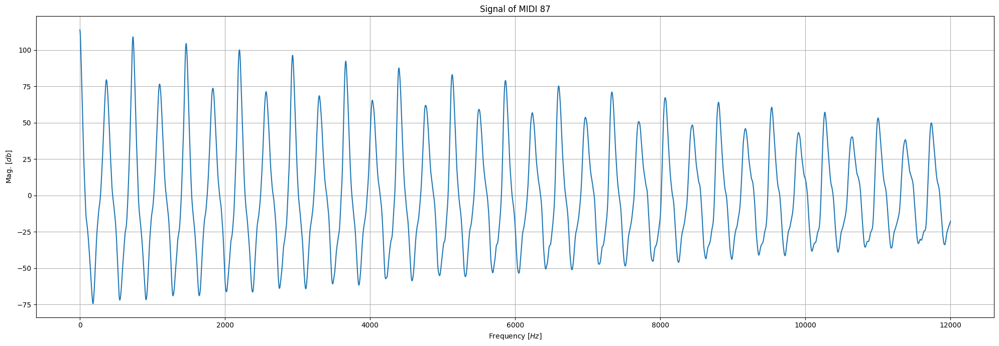

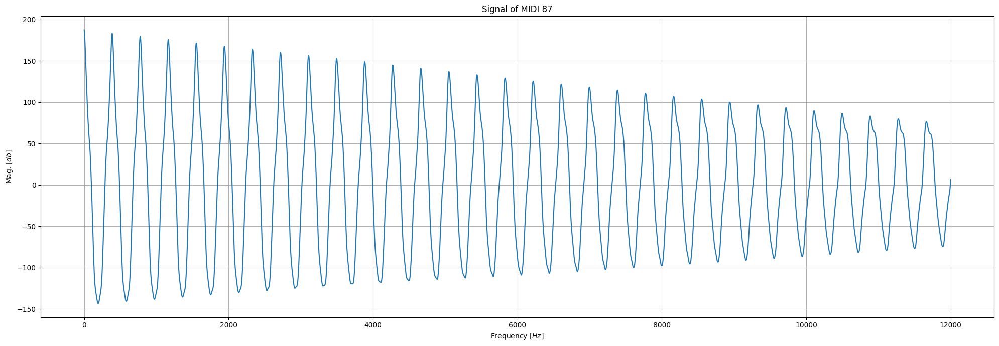

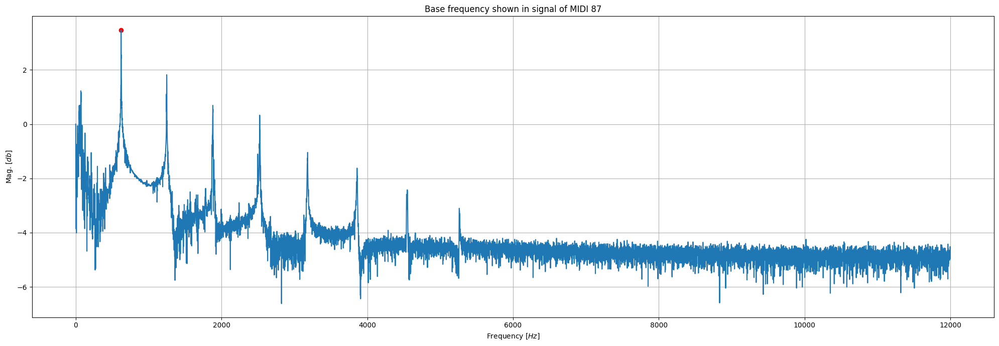

In [9]:
# Iterate through all notes
bases = np.zeros(MIDITO+1)
DFT_FROM = 60
for note_index in range(MIDIFROM, MIDITO+1):
    if note_index < DFT_FROM:
        base = compute_base_autocor(xall[note_index], (note_index in NOTES))
    else:
        base = compute_base_dft(xall[note_index], spectrum[note_index], (note_index in NOTES))
    print(f"MIDI {note_index} base frequency is {base}")
    bases[note_index] = base

# 4.3 Zpřesnění odhadu základní frekvence `f0`

In [10]:
FREQRANGE = 2
# Like a resolution of the calculation
FREQPOINTS = 80
# For every MIDI base frequency estimate

def dtft(freq, signal):
    
    spectrum_dtft = np.zeros([FREQPOINTS, N], dtype=complex)
    fsweep = np.linspace(np.abs(freq)-FREQRANGE + 1j, np.abs(freq)+FREQRANGE +1j, FREQPOINTS)
    for j in np.arange(0, FREQPOINTS):
        spectrum_dtft[j,:] = np.exp(-1j * 2 * np.pi * fsweep[j] / Fs * np.arange(0,N))
    spec = np.matmul(spectrum_dtft, signal.T)
    index = np.argmax(np.abs(spec))
    mod_phase = spec[index]
    f = np.real(fsweep[index])
    return (mod_phase, f)

# Only applying dtft to results computed by dft
for i in range(DFT_FROM, MIDITO+1):
    mod_phase, bases[i] = dtft(bases[i], xall[i])
    print("hah", mod_phase)
    
    print(f"Accourate estimate for midi {i} is {bases[i]}Hz")

hah (-5788.698695451445+2850.316115521622j)
Accourate estimate for midi 60 is 261.7721518987342Hz
hah (-2869.4423453973586+5542.983587176811j)
Accourate estimate for midi 61 is 277.3164556962025Hz
hah (1746.6693609968145+2866.941037219349j)
Accourate estimate for midi 62 is 293.62025316455697Hz
hah (-3038.361573741644-307.5075188737688j)
Accourate estimate for midi 63 is 311.11392405063293Hz
hah (1780.385551528233+2137.234907129139j)
Accourate estimate for midi 64 is 329.62025316455697Hz
hah (6093.923225984726+862.4600001773579j)
Accourate estimate for midi 65 is 349.11392405063293Hz
hah (1448.03953583264+5574.448936358442j)
Accourate estimate for midi 66 is 369.873417721519Hz
hah (-1497.7383405194232-5161.298777703069j)
Accourate estimate for midi 67 is 391.873417721519Hz
hah (-879.7730429167594+640.6713245331435j)
Accourate estimate for midi 68 is 415.36708860759495Hz
hah (-882.2557211868588-397.1064994660941j)
Accourate estimate for midi 69 is 440.0759493670886Hz
hah (595.8727366380

# 4.4 Reprezentace klavíru

In [11]:
synt_tones = np.zeros([bases.size, 5, 2])
synt_freq  = np.zeros([bases.size, 5])

for note in range(MIDIFROM, MIDITO+1):
    kall = np.arange(0,int(spectrum[note].size))
    phase = np.angle(spectrum[note][kall])
    mod = np.abs(spectrum[note][kall])

    for i in range(1, 6):
        mod_phase, freq = dtft(bases[note] * i, xall[note])
        synt_tones[note][i-1][0] = np.abs(mod_phase)
        synt_tones[note][i-1][1] = np.angle(mod_phase)
        synt_freq[note][i-1] = freq

    print(synt_tones[note])

[[ 3.04191317e+02  2.07770051e+00]
 [ 6.87641153e+03 -2.37403037e-01]
 [ 4.21570234e+03  1.06843848e-01]
 [ 3.28368894e+03  4.86324437e-01]
 [ 1.98531860e+03 -2.77145750e+00]]
[[ 2.11098291e+02 -1.56165413e-01]
 [ 6.71689120e+03 -4.33707355e-01]
 [ 3.95000647e+03  2.89654092e+00]
 [ 3.25041372e+03 -3.89136937e-02]
 [ 2.23112098e+03 -2.50907343e-01]]
[[ 1.64088644e+02  2.88378016e+00]
 [ 6.68264399e+03 -3.06811743e-01]
 [ 3.98260426e+03  5.91111736e-02]
 [ 3.06266468e+03  4.99288899e-01]
 [ 1.96321321e+03 -2.71620565e+00]]
[[ 2.31025196e+02 -2.24540525e+00]
 [ 6.59012396e+03  2.61405197e-01]
 [ 4.02055060e+03 -2.24230424e+00]
 [ 3.25326845e+03  1.64151328e+00]
 [ 1.90373352e+03  1.96523154e+00]]
[[ 2.75774081e+02  2.84539262e+00]
 [ 6.27238323e+03  1.33468106e+00]
 [ 3.57904636e+03  2.44752641e+00]
 [ 2.76600375e+03 -2.61111910e+00]
 [ 1.99785463e+03  8.93404091e-01]]
[[ 1.01194954e+02 -2.40360909e+00]
 [ 6.54383820e+03  2.58692711e+00]
 [ 3.60383972e+03  1.37289859e+00]
 [ 2.90815921e+

[[ 6.94426087e+03  6.53542027e-02]
 [ 4.61020669e+02  3.60282882e-01]
 [ 1.33812840e+02 -2.49541470e+00]
 [ 2.04485778e+01 -9.73974397e-01]
 [ 4.85999717e+00 -2.07080889e+00]]
[[ 6.41233678e+03  2.23328345e+00]
 [ 3.72393340e+02 -1.47608229e+00]
 [ 6.20095210e+01 -1.93693887e+00]
 [ 2.43858381e+01  2.21810038e+00]
 [ 4.36949363e+00  2.09583861e+00]]
[[ 5.90122654e+03  8.22589946e-01]
 [ 2.76001292e+02  2.21821325e+00]
 [ 4.43916583e+01  6.43674387e-01]
 [ 1.80850385e+01 -2.38981229e+00]
 [ 1.35017085e+00 -1.25195332e+00]]
[[ 5.50316286e+03  2.23984549e+00]
 [ 2.21458822e+02 -8.93973524e-01]
 [ 6.86643942e+01 -1.20835966e+00]
 [ 1.95931776e+01 -6.07904422e-01]
 [ 3.65857768e+00  1.20813966e+00]]
[[ 5.05475305e+03  5.21706317e-01]
 [ 1.87973603e+02  2.37030854e+00]
 [ 6.83183493e+01 -1.21550583e-01]
 [ 1.73422843e+01 -1.78887063e+00]
 [ 2.53763494e+00 -7.32114972e-01]]
[[ 4.61255626e+03  2.08554673e+00]
 [ 1.75471324e+02 -7.00877137e-01]
 [ 7.18681969e+01 -1.54132458e+00]
 [ 1.14099708e+

188.05170879043436 [5.00000000e-05 1.09907750e+00 1.26002600e+00 ... 1.09250609e+00
 1.26002600e+00 1.09907750e+00]
5924.276974478413 [5.00000000e-05 1.09907750e+00 1.26002600e+00 ... 1.09250609e+00
 1.26002600e+00 1.09907750e+00]
2114.7452195295537 [5.00000000e-05 1.09907750e+00 1.26002600e+00 ... 1.09250609e+00
 1.26002600e+00 1.09907750e+00]
2245.2639541274452 [5.00000000e-05 1.09907750e+00 1.26002600e+00 ... 1.09250609e+00
 1.26002600e+00 1.09907750e+00]
944.9068483841672 [5.00000000e-05 1.09907750e+00 1.26002600e+00 ... 1.09250609e+00
 1.26002600e+00 1.09907750e+00]
7835.910697223697 [5.00000000e-05 2.01643496e+00 2.02082731e+00 ... 1.91451143e+00
 2.02082731e+00 2.01643496e+00]
872.3030766580573 [5.00000000e-05 2.01643496e+00 2.02082731e+00 ... 1.91451143e+00
 2.02082731e+00 2.01643496e+00]
1659.4886976036776 [5.00000000e-05 2.01643496e+00 2.02082731e+00 ... 1.91451143e+00
 2.02082731e+00 2.01643496e+00]
2707.6942243563517 [5.00000000e-05 2.01643496e+00 2.02082731e+00 ... 1.91451

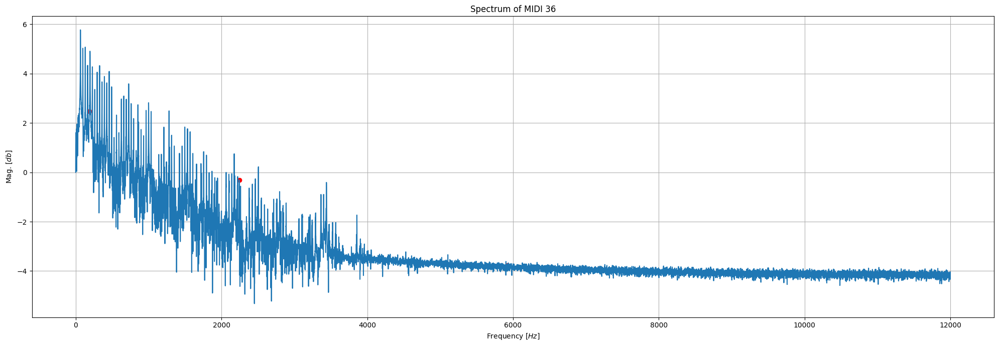

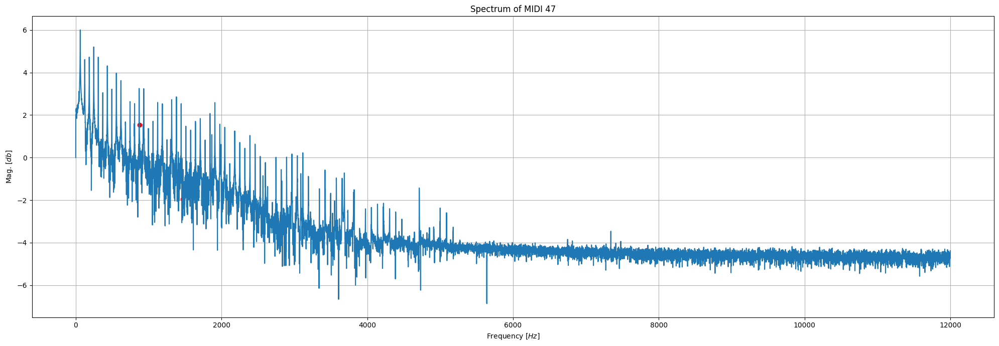

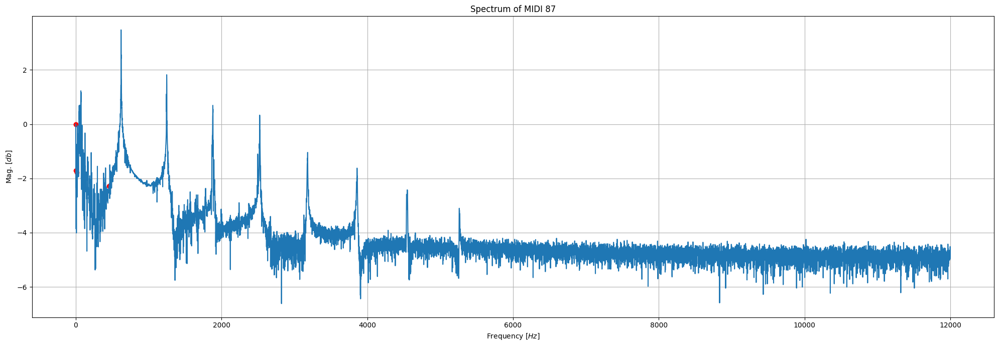

In [12]:
for note in NOTES:
    s = np.log10(np.abs(spectrum[note]) ** 2)
    s[0]=0.00005
    
    fig = plt.figure(figsize=(20, 7))
    ax = fig.add_subplot(111)
    ax.set_title(f"Spectrum of MIDI {note}")
    ax.set_xlabel(f"Frequency $[Hz]$")
    ax.set_ylabel(f"Mag. $[db]$")
    for index, tone in enumerate(synt_tones[note]):
        print(tone[0], s)
        ax.plot(tone[0], s[int(tone[0])], "ro")
        ax.plot()
    ax.plot(s[:s.size//2])
    ax.grid()
    plt.tight_layout()

# 4.5 Syntéza tónů

1090 545
Frequency, module: 34.15691018274506 304.19131673177986
Frequency, module: 65.35179504903442 6876.411525447521
Frequency, module: 98.11630016848834 4215.702343129183
Frequency, module: 131.03270402211947 3283.6889374126044
Frequency, module: 163.59467749600378 1985.3185967851898
(20629.234576342562-0.23740303745922825j)
Frequency, module: 32.73227206946454 211.0982906578664
Frequency, module: 69.23669603766326 6716.891202028645
Frequency, module: 104.0196010185202 3950.006473656089
Frequency, module: 138.95440473355438 3250.4137213633694
Frequency, module: 173.4335122460569 2231.1209755418495
(20150.673606085937-0.4337073549094561j)
Frequency, module: 37.97148261312382 164.08864364985533
Frequency, module: 73.38600320093117 6682.643987693115
Frequency, module: 110.16761239633347 3982.604263429323
Frequency, module: 147.10112032591297 3062.664684166252
Frequency, module: 183.62956496435325 1963.2132059290855
(20047.931963079347-0.30681174329137084j)
Frequency, module: 38.024330

/tmp/ipykernel_22653/3560653383.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  synt_signal[index] = np.fft.ifft(spec)


Frequency, module: 67.92024034146073 145.955770381469
Frequency, module: 138.39744270823792 5783.605041474893
Frequency, module: 207.861986847167 2056.8517435806493
Frequency, module: 277.3265309860961 2134.053163890474
Frequency, module: 346.7910751250252 994.3614404103863
(17350.81512442468+1.1305812126069477j)
Frequency, module: 72.9752457014364 1298.299969055497
Frequency, module: 146.8872002636323 3289.6537803870074
Frequency, module: 220.14092697772696 3830.2929391030752
Frequency, module: 293.7490840715684 1005.0636081220654
Frequency, module: 367.1040766084478 737.0773252436671
(11490.878817309225-2.73682479845006j)
Frequency, module: 77.33979944106527 1288.5934868128377
Frequency, module: 155.61630774289003 3176.212557454677
Frequency, module: 233.23458819661354 3643.895309035605
Frequency, module: 311.2072990300839 971.4898638215559
Frequency, module: 388.87621239519984 661.9931078964757
(10931.685927106815-1.0395674328315343j)
Frequency, module: 81.94258123450346 1174.147639

Frequency, module: 130.51170972303657 7449.799873837546
Frequency, module: 260.7449384334149 712.9960720428909
Frequency, module: 392.64905321974265 1556.524439930668
Frequency, module: 523.7430414237919 2569.4951744504433
Frequency, module: 654.6851308936639 1375.0094815305229
(22349.39962151264-2.5517783701450303j)
Frequency, module: 138.2473110411941 7132.968900926952
Frequency, module: 276.21614106973 652.570943878123
Frequency, module: 416.0077559083925 1483.3749109987414
Frequency, module: 554.8879783419917 2485.983743393006
Frequency, module: 693.6163020414136 1321.5567453349631
(21398.906702780856-2.8813307993764505j)
Frequency, module: 146.66240854720706 3959.099368885482
Frequency, module: 294.2108930437812 656.8295479104011
Frequency, module: 440.49355475554523 3352.4628223161358
Frequency, module: 587.4850772268029 779.0224312441127
Frequency, module: 734.4765996980607 607.3346711659907
(11877.298106656446-3.106122904560156j)
Frequency, module: 155.36512228093895 3499.21201

Frequency, module: 1318.506329113924 456.5524819786837
Frequency, module: 2637.0379746835442 13.449764044263029
Frequency, module: 3957.5949367088606 1.3971755091868385
Frequency, module: 5272.430379746836 0.20643278970869192
Frequency, module: 6591.46835443038 0.1581522774526484
(1369.657445936051+0.8250138711801526j)
Frequency, module: 1395.8987341772151 391.0032307840143
Frequency, module: 2793.8481012658226 10.970135602507108
Frequency, module: 4189.215189873417 0.6699293745801101
Frequency, module: 5585.493670886076 0.15808925917707248
Frequency, module: 6981.06329113924 0.11213548861545294
(1173.009692352043-3.0112895947513003j)
Frequency, module: 1479.012658227848 332.7300628795307
Frequency, module: 2960.0759493670885 4.769563435290886
Frequency, module: 4439.113924050633 0.48072639287192553
Frequency, module: 5918.151898734177 0.10685037792448489
Frequency, module: 7396.5822784810125 0.04180807902002655
(998.1901886385921+1.5771614288669935j)
Frequency, module: 1567.0632911392

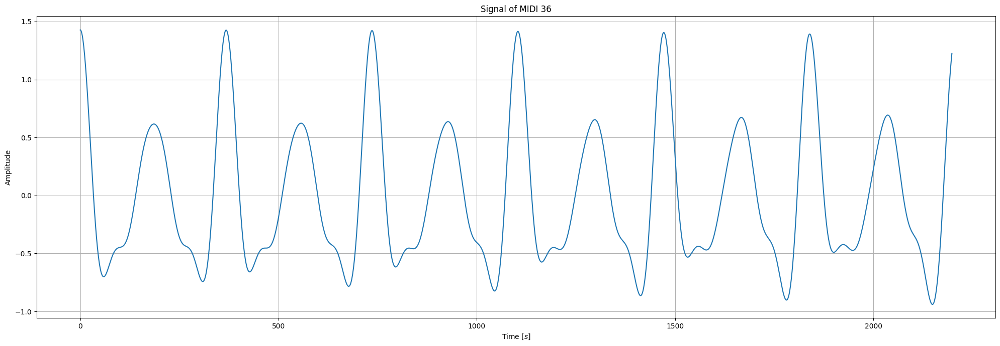

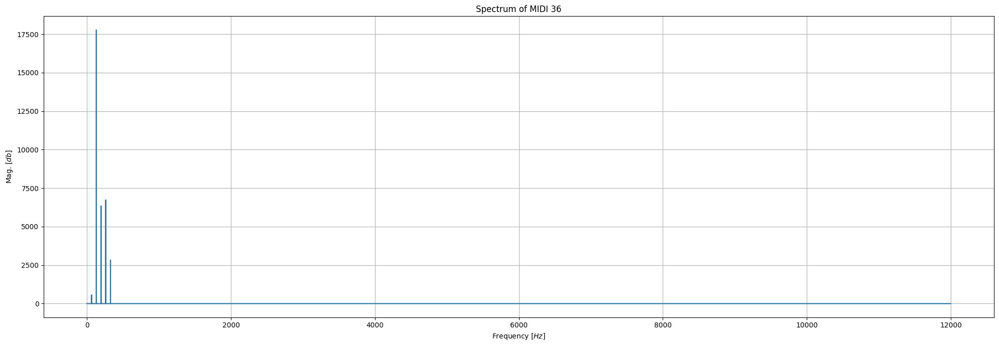

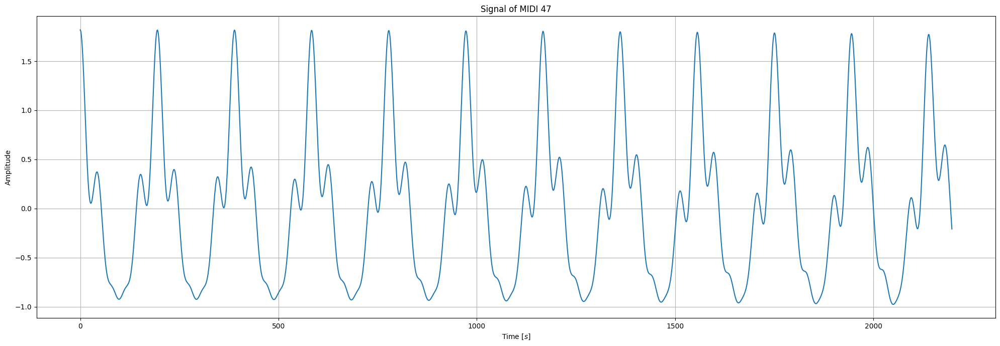

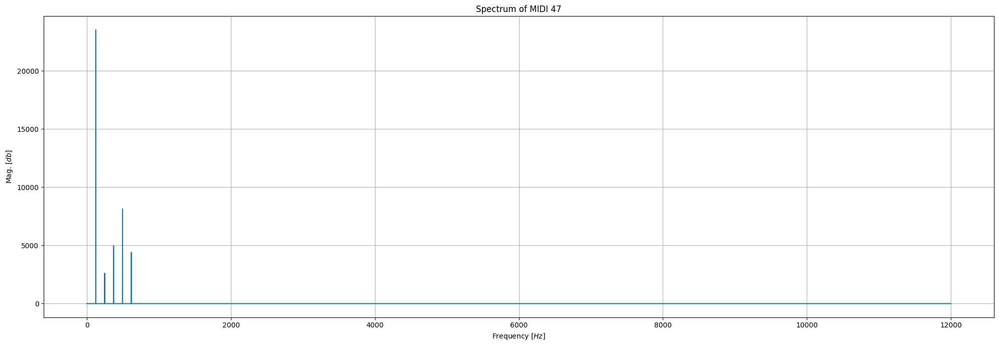

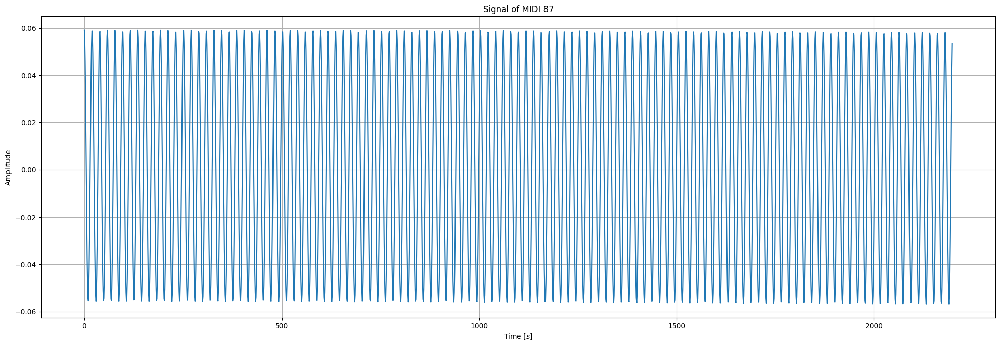

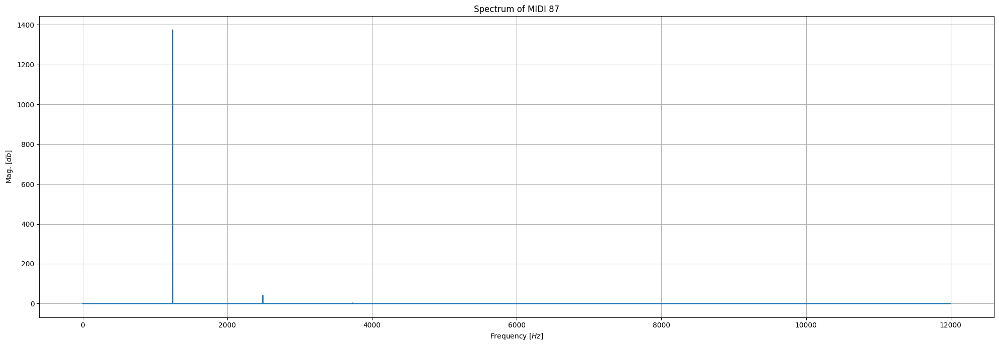

In [13]:
synt_signal = np.zeros([MIDITO+1, Fs//2])

print(synt_tones.size, synt_freq.size)
for index in range(MIDIFROM, MIDITO+1):
    spec = np.zeros(Fs//2, dtype=complex)
    for i in range(5):
        spec[int(synt_freq[index][i])] = synt_tones[index][i][0] * 3 + synt_tones[index][i][1] * 1j
        print("Frequency, module:", synt_freq[index][i], synt_tones[index][i][0])
    synt_signal[index] = np.fft.ifft(spec)
    print(max(spec))
    
    if index in NOTES:
        cnt = 0
        left_bound = 0
        right_bound = left_bound + int(Fs / NOTE_FREQS[cnt]) * PERIOD_REPEAT
        sample = synt_signal[index][left_bound:right_bound]
        
        # Signal
        fig = plt.figure(figsize=(20, 7))
        ax = fig.add_subplot(111)
        ax.set_title(f"Signal of MIDI {index}")
        ax.set_xlabel(f"Time $[s]$")
        ax.set_ylabel(f"Amplitude")
        ax.plot(sample)
        ax.grid()
        plt.tight_layout()

        #spectrum
        fig = plt.figure(figsize=(20, 7))
        ax = fig.add_subplot(111)
        s = spec#np.log10(np.abs(spectrum[note]) ** 2)
        s[0] = 0.00001
        ax.set_title(f"Spectrum of MIDI {index}")
        ax.set_xlabel(f"Frequency $[Hz]$")
        ax.set_ylabel(f"Mag. $[db]$")
        ax.plot(np.real(spec[:spec.size//2]))
        ax.grid()
        plt.tight_layout()

        display(Audio(synt_signal[index], rate=Fs))
        cnt += 1


In [14]:
#synt_signal = np.array(synt_signal)
print(len(synt_signal))

109


# 4.5 Generování hudby

syntones (109, 24000)
LINE 1
44162.79069767442 44197.67441860465 34 12
from, to 2119813.953488372 2121488.3720930233
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 1675
LINE 2
63395.348837209305 63430.232558139534 34 11
from, to 3042976.7441860465 3044651.1627906975
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 1675
LINE 3
169162.7906976744 169197.67441860464 34 11
from, to 8119813.953488371 8121488.372093023
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 1675
LINE 4
188383.72093023255 188430.2325581395 34 11
from, to 9042418.604651162 9044651.162790697
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 2233
LINE 5
121976.74418604652 122011.62790697675 35 15
from, to 5854883.720930233 5856558.139534883
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 1675
LINE 6
73162.79069767443 73186.04651162791 40 51
from, to 3511813.9534883723 3512930.2325581396
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 1117
LINE 7
246232.5581395349 246255.81395

size 24000
hahahasdkjhflakhsdf 24000000 18977
LINE 1260
261139.5348837209 261534.88372093023 75 25
from, to 12534697.674418604 12553674.418604651
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 18977
LINE 1261
266395.34883720934 266686.0465116279 75 26
from, to 12786976.744186047 12800930.23255814
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 13954
LINE 1262
269697.67441860464 270093.0232558139 75 28
from, to 12945488.372093024 12964465.11627907
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 18977
LINE 1263
270755.81395348837 271093.0232558139 75 24
from, to 12996279.069767442 13012465.11627907
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 16186
LINE 1264
276011.62790697673 276313.9534883721 75 25
from, to 13248558.139534883 13263069.76744186
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24000000 14511
LINE 1265
279313.9534883721 279697.67441860464 75 26
from, to 13407069.76744186 13425488.372093024
repeat 1
haha 0
size 24000
hahahasdkjhflakhsdf 24

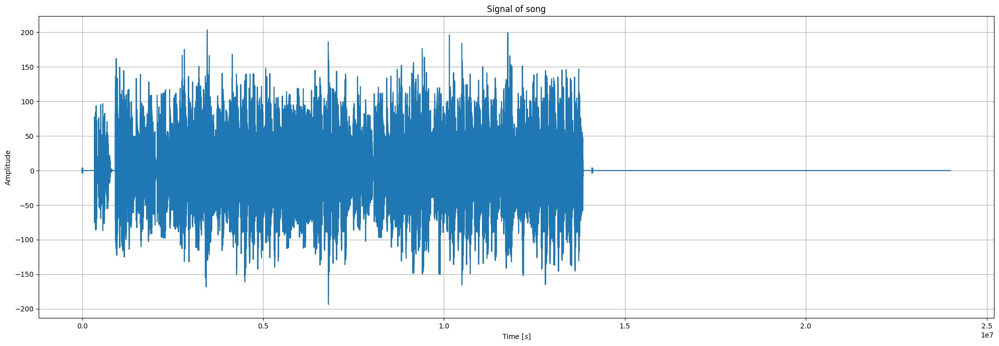

In [18]:
song = np.zeros([500 * Fs], dtype=complex)
song_src = None
print("syntones", synt_signal.shape)
with open("../audio/thesis.txt", "r", encoding="utf-8") as f:
    line = 1
    while True:
        print("LINE", line)
        line += 1
        song_src = f.readline()
        print(song_src, end='')
        song_src = song_src.split(' ')
        if song_src[0] == '':
            break
        from_sample = float(song_src[0]) / 1000 * Fs
        to_sample = float(song_src[1]) / 1000 * Fs
        if int(song_src[2]) / 1000 * Fs >= 10*Fs:
            break
        print("from, to", from_sample, to_sample)
        repeat = 1 + int((to_sample-from_sample) / synt_signal[int(song_src[2])].size )
        print("repeat", repeat)
        print("haha", (int(repeat)-1) * synt_signal.size)
        print("size", np.tile(synt_signal[int(song_src[2])], repeat).size)
        print("hahahasdkjhflakhsdf", song.size,song[int(from_sample):int(to_sample)].size)
        
        song[int(from_sample) : int(to_sample)] += np.tile(synt_signal[int(song_src[2])], repeat)[:int(to_sample)-int(from_sample)] * float(song_src[3])

display(Audio(song[:120*Fs], rate=Fs))

fig = plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
ax.set_title(f"Signal of song")
ax.set_xlabel(f"Time $[s]$")
ax.set_ylabel(f"Amplitude")
ax.plot(song)
ax.grid()
plt.tight_layout()